<a href="https://colab.research.google.com/github/Lukas-Swc/neural-network-course/blob/main/06_cnn/01_image_preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Image Preprocessing - przygotowanie obrazów

**Augmentacja danych** - technika pozwalająca na zwiększenie zbioru treningowego przez odpowiednie przekształcenia danych wejsciowych. Technika bardzo przydtna zwłaszcza gdy nie mamy wystarczającej ilości danych do wytrenowania sieci. W uczeniu głębokim im więcej posiadamy danych treningowych tym teoretycznie lepiej jesteśmy w stanie wytrenować sieć. Wykorzystamy tą technikę do trenowania problemów związanych z przetwarzaniem obrazu.

Biblioteka Keras dostarcza narzędzia do augmentacji danych, które działają automatycznie podczas trenowania sieci. Możemy to zrobić dzięki klasie **ImageDataGenerator**.

In [1]:
# %tensorflow_version 2.x
import matplotlib.pyplot as plt
from numpy import expand_dims
import tensorflow as tf

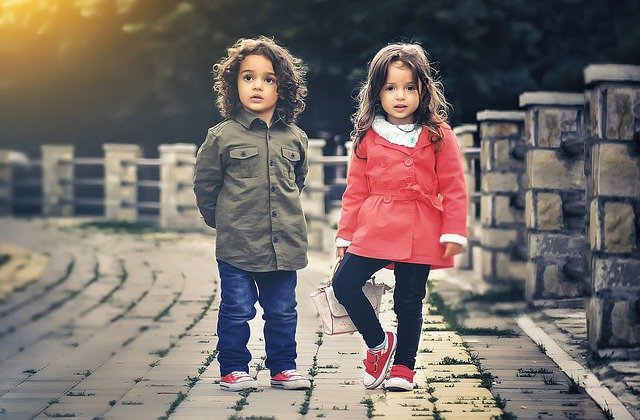

In [2]:
img = tf.keras.preprocessing.image.load_img('children.jpg')
img

In [3]:
data = tf.keras.preprocessing.image.img_to_array(img)
data.shape

(420, 640, 3)

In [4]:
data

array([[[248., 206.,  88.],
        [246., 205.,  89.],
        [246., 206.,  93.],
        ...,
        [ 18.,  24.,  38.],
        [ 16.,  22.,  36.],
        [ 15.,  21.,  35.]],

       [[251., 208.,  93.],
        [249., 208.,  92.],
        [247., 209.,  98.],
        ...,
        [ 18.,  24.,  38.],
        [ 16.,  22.,  36.],
        [ 15.,  21.,  35.]],

       [[250., 209.,  95.],
        [247., 207.,  93.],
        [246., 210., 100.],
        ...,
        [ 18.,  24.,  38.],
        [ 16.,  22.,  36.],
        [ 15.,  21.,  35.]],

       ...,

       [[102., 110., 123.],
        [101., 109., 122.],
        [100., 108., 119.],
        ...,
        [129., 127., 128.],
        [132., 130., 135.],
        [116., 114., 119.]],

       [[101., 109., 122.],
        [101., 109., 122.],
        [101., 109., 120.],
        ...,
        [131., 129., 130.],
        [103., 101., 106.],
        [112., 110., 115.]],

       [[101., 109., 122.],
        [101., 109., 122.],
        [101., 1

In [5]:
data[:, :, 0]

array([[248., 246., 246., ...,  18.,  16.,  15.],
       [251., 249., 247., ...,  18.,  16.,  15.],
       [250., 247., 246., ...,  18.,  16.,  15.],
       ...,
       [102., 101., 100., ..., 129., 132., 116.],
       [101., 101., 101., ..., 131., 103., 112.],
       [101., 101., 101., ..., 100.,  87.,  99.]], dtype=float32)

In [6]:
data[:, :, 1]

array([[206., 205., 206., ...,  24.,  22.,  21.],
       [208., 208., 209., ...,  24.,  22.,  21.],
       [209., 207., 210., ...,  24.,  22.,  21.],
       ...,
       [110., 109., 108., ..., 127., 130., 114.],
       [109., 109., 109., ..., 129., 101., 110.],
       [109., 109., 109., ...,  98.,  85.,  97.]], dtype=float32)

In [7]:
data[:, :, 2]

array([[ 88.,  89.,  93., ...,  38.,  36.,  35.],
       [ 93.,  92.,  98., ...,  38.,  36.,  35.],
       [ 95.,  93., 100., ...,  38.,  36.,  35.],
       ...,
       [123., 122., 119., ..., 128., 135., 119.],
       [122., 122., 120., ..., 130., 106., 115.],
       [122., 122., 120., ...,  99.,  90., 102.]], dtype=float32)

In [8]:
samples = expand_dims(data, 0)
samples

array([[[[248., 206.,  88.],
         [246., 205.,  89.],
         [246., 206.,  93.],
         ...,
         [ 18.,  24.,  38.],
         [ 16.,  22.,  36.],
         [ 15.,  21.,  35.]],

        [[251., 208.,  93.],
         [249., 208.,  92.],
         [247., 209.,  98.],
         ...,
         [ 18.,  24.,  38.],
         [ 16.,  22.,  36.],
         [ 15.,  21.,  35.]],

        [[250., 209.,  95.],
         [247., 207.,  93.],
         [246., 210., 100.],
         ...,
         [ 18.,  24.,  38.],
         [ 16.,  22.,  36.],
         [ 15.,  21.,  35.]],

        ...,

        [[102., 110., 123.],
         [101., 109., 122.],
         [100., 108., 119.],
         ...,
         [129., 127., 128.],
         [132., 130., 135.],
         [116., 114., 119.]],

        [[101., 109., 122.],
         [101., 109., 122.],
         [101., 109., 120.],
         ...,
         [131., 129., 130.],
         [103., 101., 106.],
         [112., 110., 115.]],

        [[101., 109., 122.],
       

In [9]:
samples.shape

(1, 420, 640, 3)

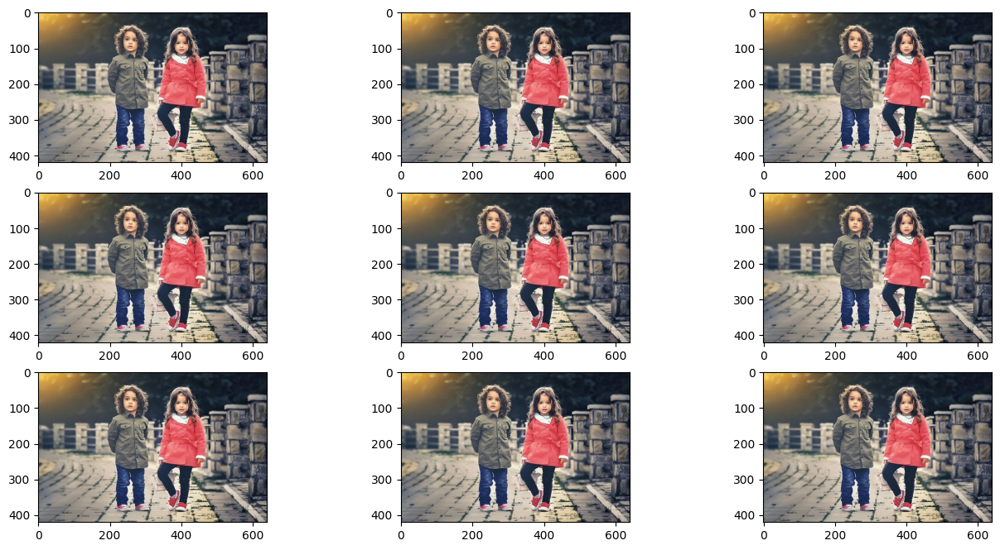

In [10]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator()

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = iterator.__next__()
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

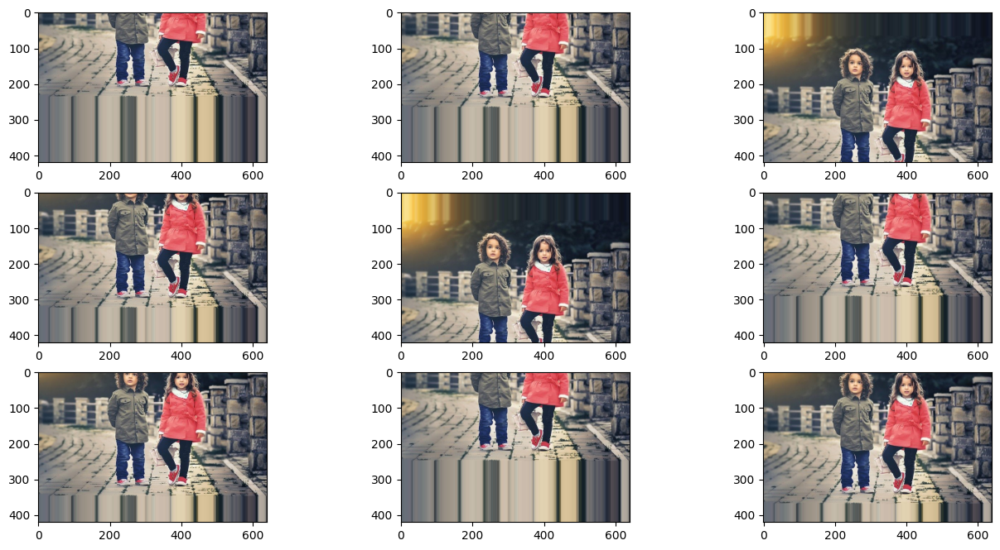

In [11]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(width_shift_range=0.3)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = iterator.__next__()
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

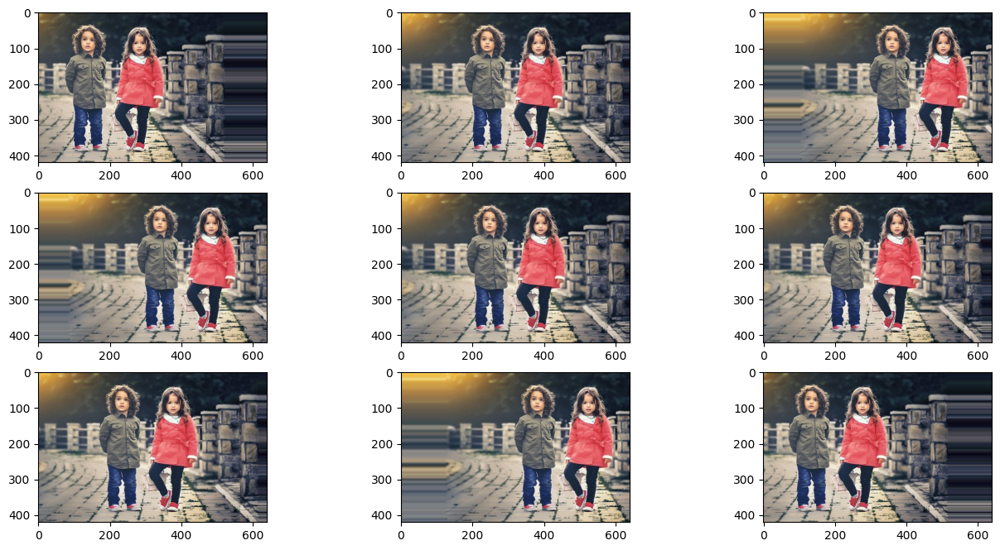

In [12]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(height_shift_range=0.3)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = iterator.__next__()
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

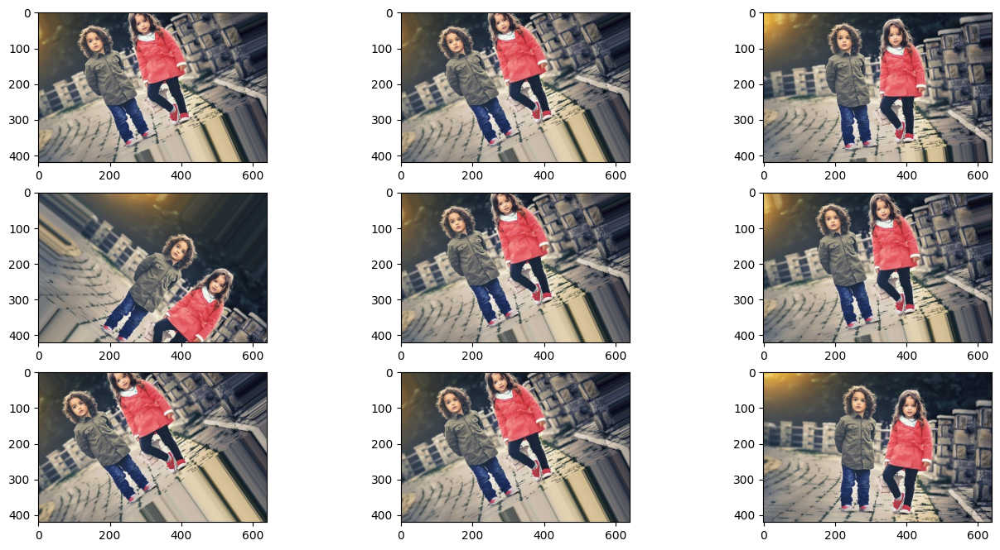

In [13]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=45)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = iterator.__next__()
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

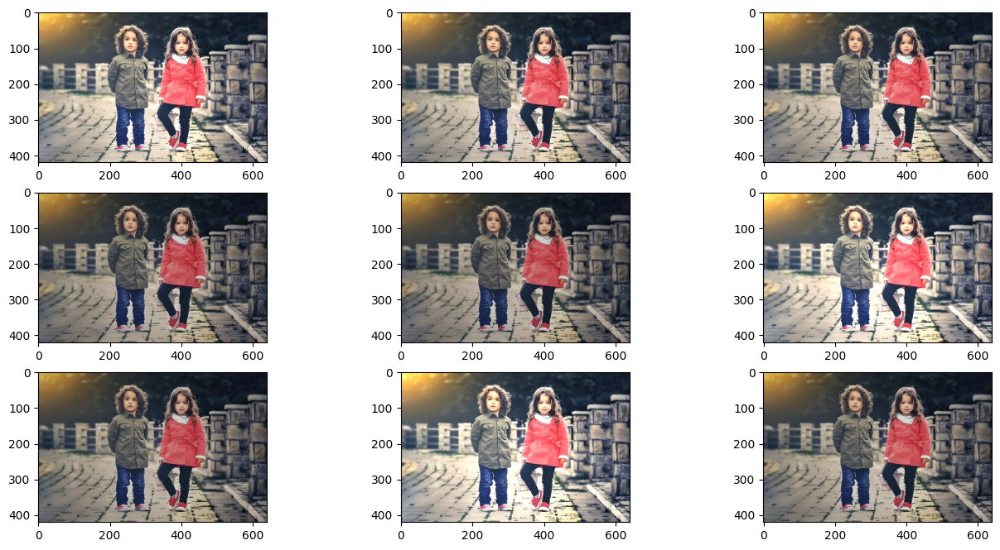

In [14]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(brightness_range=[0.4, 1.5])

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = iterator.__next__()
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

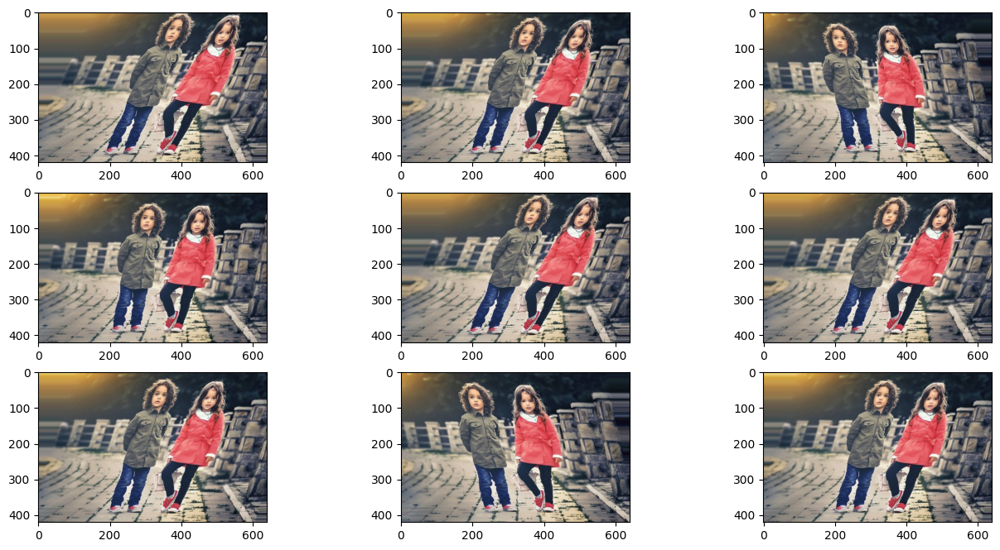

In [15]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(shear_range=30)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = iterator.__next__()
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

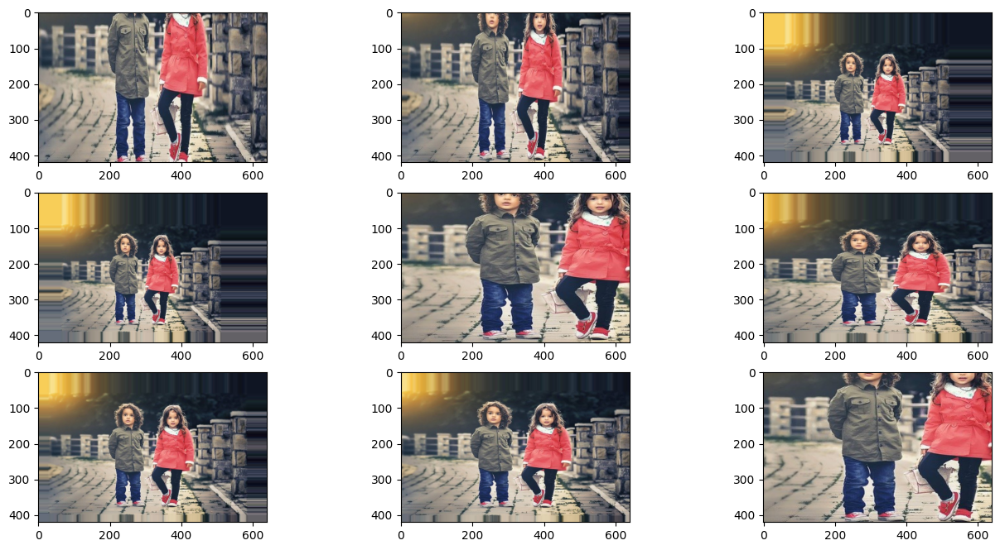

In [16]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(zoom_range=0.5)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = iterator.__next__()
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

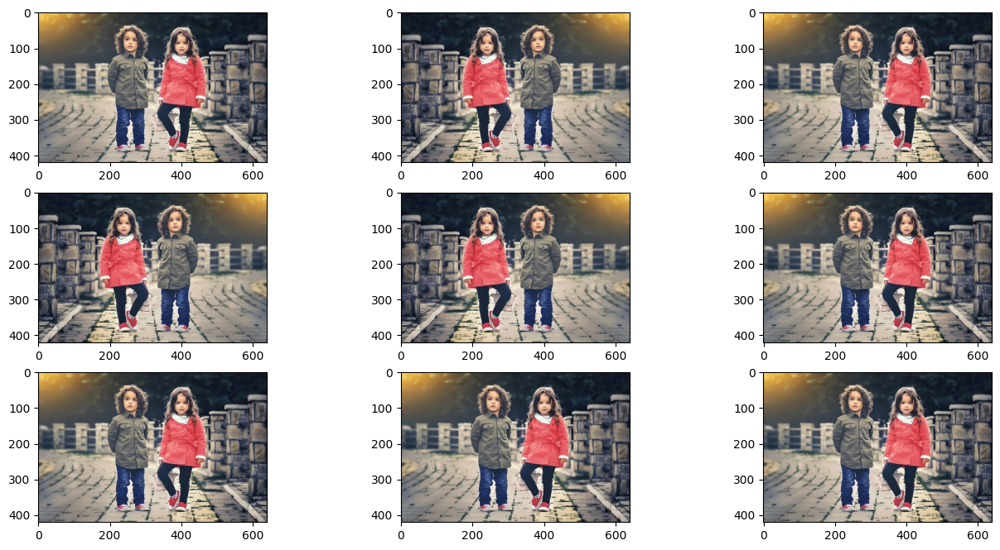

In [17]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(horizontal_flip=True)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = iterator.__next__()
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

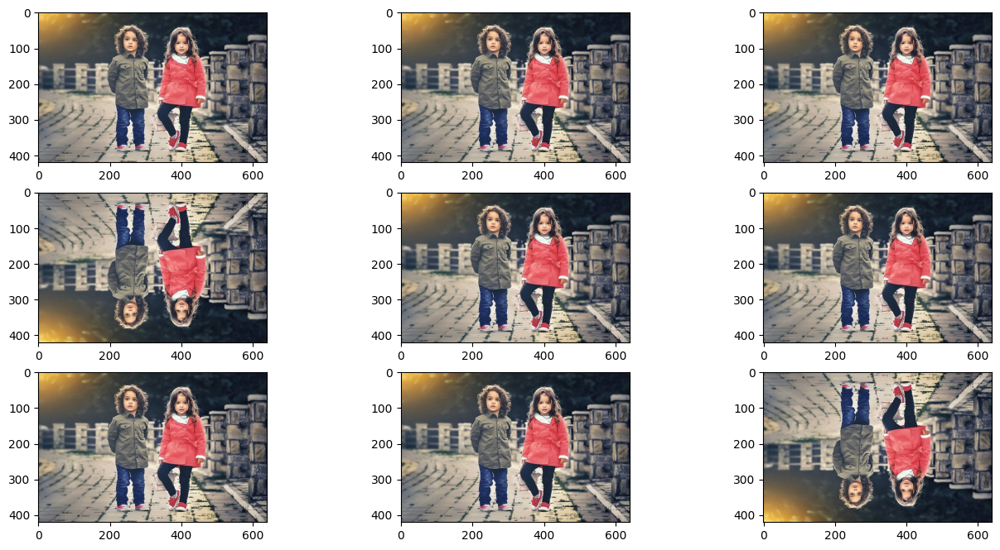

In [18]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(vertical_flip=True)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = iterator.__next__()
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

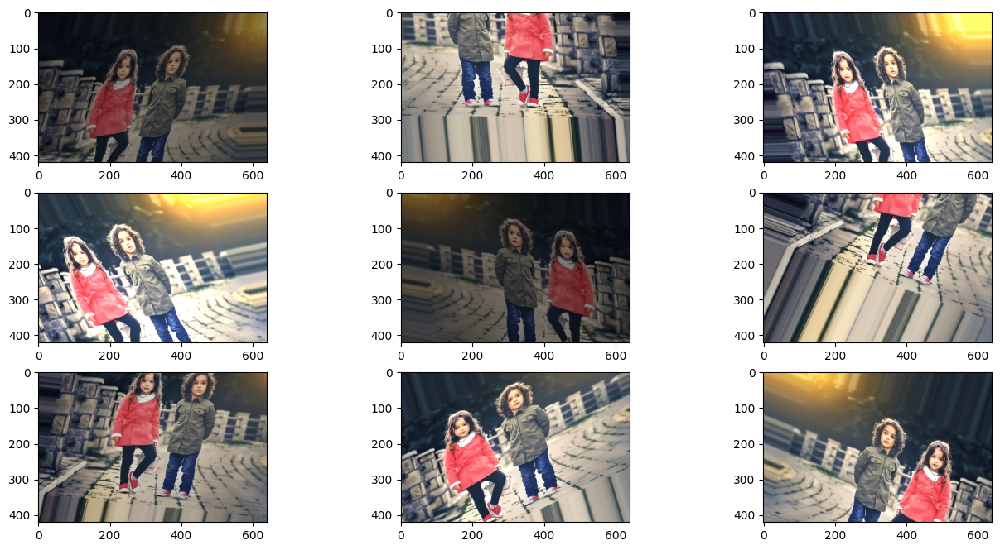

In [19]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(width_shift_range=0.2,
                             height_shift_range=0.2,
                             rotation_range=30,
                             brightness_range=[0.4, 1.5],
                             shear_range=20,
                             zoom_range=0.1,
                             horizontal_flip=True)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = iterator.__next__()
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()